# **TP1 : Traitement Avancé des Images**

26/09/23
<u> Victoria NGUYEN, 28604687</u>


5AI03 - TP - ESTIMATION DE MOUVEMENT

Afin d'avoir les illustrations, faire ```run all```.
Pour changer les photos, changer la(les) variables ```filename```

In [1]:
import numpy as np
import PIL
import cv2 as cv
from utils_tp import *
import matplotlib.pyplot as plt

#image a traiter    
filename = "pics/P1.JPG"
src_image = cv.imread(filename)
img_gray = gris_moyen(src_image)


Ix,Iy, Ix_carre, Iy_carre, Ixy = gradients(img_gray)

## EXERCICE 1: DETECTION DE POINTS D’INTERET

### 1ab) Detecteur de Harris avec fenetre rectangulaire AVEC et SANS suppression des non-maxima locaux

Ci-dessous le code d'implémentation du détecteur de Harris avec une fenetre rectangulaire. L'algorithme consiste a calculer les dérivées X/Y de l'image, de les mettre au carré. Par la suite, on fait glisser une fenetre, rectangulaire ici, selon un déplacement choisi par le paramètre offset. On applique ensuite la formule du cours.

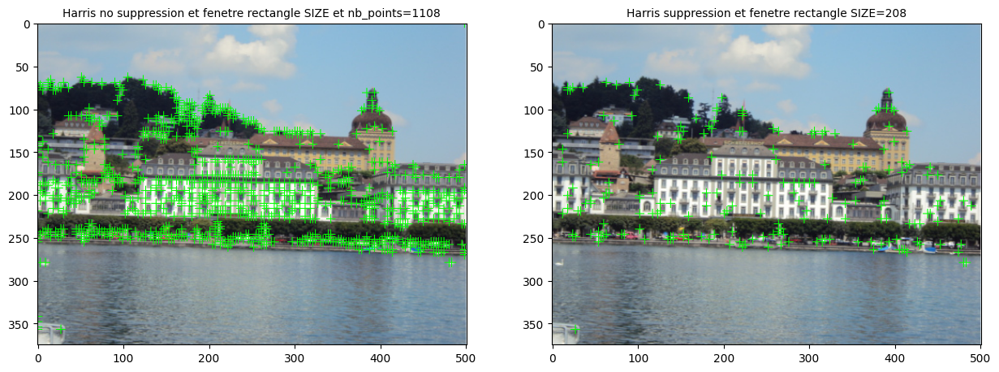

In [2]:

########## FENETRE CARRE ##########

k = 0.04
taille_fenetre = 3
deplacement_fenetre = 3
seuil = 0.015

couleur = (0,255,0)

res, list_corners_no_supp_rect = Harris_rectangle(src_image, Ix_carre, Iy_carre, Ixy,seuil,k,False,taille_fenetre ,deplacement_fenetre,couleur)
res_avec_suppression, list_corners_with_supp_rect = Harris_rectangle(src_image, Ix_carre, Iy_carre, Ixy,seuil,k,True,taille_fenetre ,deplacement_fenetre,couleur)

res = cv.cvtColor(res, cv.COLOR_BGR2RGB)
res_avec_suppression = cv.cvtColor(res_avec_suppression, cv.COLOR_BGR2RGB)

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
#axe
plt.imshow(res)
plt.title("Harris no suppression et fenetre rectangle SIZE et nb_points="+str(len(list_corners_no_supp_rect)), size=10)
plt.subplot(1,2,2)
plt.imshow(res_avec_suppression)
plt.title("Harris suppression et fenetre rectangle SIZE="+str(len(list_corners_with_supp_rect)), size=10)
plt.show()


L'implémentation du dectecteur de Harris avec une fenetre rectangulaire donne des résultats cohérents : les zones homogènes (ciel + pelouse pour la montagne, et ciel et eau pour le paysage) n'ont pas de points d'intérêt, tandis que les coins apparaissent bien. Le résultat __AVEC__ et __SANS__ suppression des non-maxima locaux est montré : on voit que cela a permis de divisé par ```10 ``` environ le nombre de coins detecté. En particulier, on retrouve biens les coins, sans avoir des amas de points d'intérêt.


Temps d'éxecution pour 2 images avec et sans non-maxima locaux : 

``` 1 secondes ```


```suppression_non_maxima_avant_seuillage``` s'occupe de supprimer les non-maxima locaux avant le seuillage. On évite les amas de points d'intérêt.

### 1ab) Detecteur de Harris avec fenetre Gaussienne AVEC et SANS suppression des non-maxima locaux

Ci-dessous le code d'implémentation du détecteur de Harris avec une fenetre Gaussienne. La différence est que l'on pondère les dérivées X/Y par une fenetre Gaussienne, donnant plus d'importance aux pixels du centre de la fenetre. On applique ensuite la formule du cours. Nous avons moins de points d'interets avec cette méthode, les coins restent cohérents et les zones homogènes n'ont pas de points d'intérêt. 

**L'influence des paramètres est discutée dans la partie 1c).**

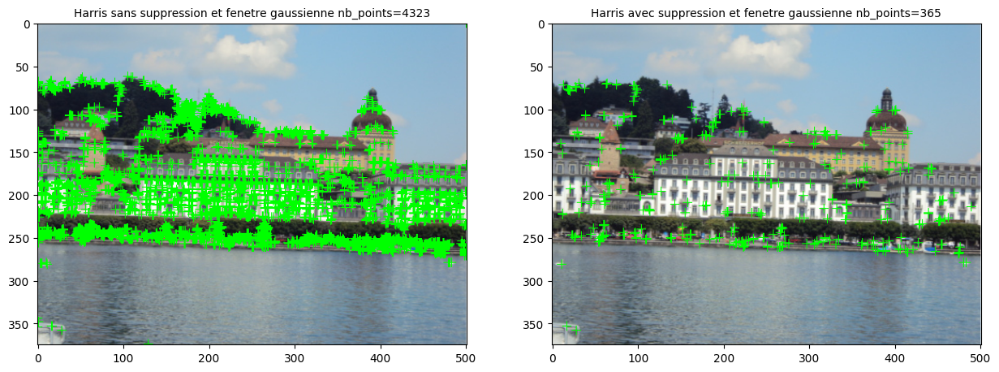

In [3]:
########## FENETRE Gauss ##########
#def Harris_gaussienne(src, Ix_carre, Iy_carre, Ixy, masque_gaussien,k,flag_suppression_non_maxima,coeff_seuil,couleur):

k=0.04
couleur = (0,255,0)

res_gauss, liste_coins_sans_supp = Harris_gaussienne(src_image, Ix_carre, Iy_carre, Ixy, masque_gaussien_formula,k, False, 0.015,couleur)
res_gauss_suppression,liste_coins = Harris_gaussienne(src_image, Ix_carre, Iy_carre, Ixy, masque_gaussien_formula,k,True,0.015,couleur)

res_gauss = cv.cvtColor(res_gauss, cv.COLOR_BGR2RGB)
res_gauss_suppression = cv.cvtColor(res_gauss_suppression, cv.COLOR_BGR2RGB)

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(res_gauss)
plt.title("Harris sans suppression et fenetre gaussienne nb_points="+str(len(liste_coins_sans_supp)), size=10)
plt.subplot(1,2,2)
plt.imshow(res_gauss_suppression)
plt.title("Harris avec suppression et fenetre gaussienne nb_points="+str(len(liste_coins)), size=10)
plt.show()


### c) Influence des paramètres : 

Comme demandé dans l'énoncé, la partie suivante vise a lancer le detecteur avec la même image, mais en testant avec différents paramètres pour voir leur influence respectives.


- <u> Influence du type de la fenetre : </u>

La fenetre rectangulaire classique attribue le même poids à tous les pixels de la fenêtre . On observe plus de points detectés pour le cas avec la gaussienne. Cette fentre permet aussi de réduire le bruit dans l'image (effet lisseur), et donc de reduire le bruit dans les dérivées. 

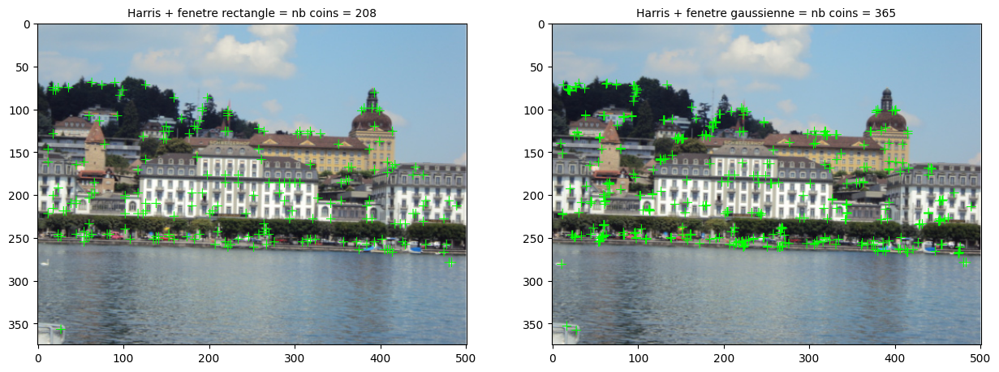

In [4]:
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(res_avec_suppression)
plt.title("Harris + fenetre rectangle = nb coins = "+str(len(list_corners_with_supp_rect)), size=10)
plt.subplot(1,2,2)
plt.imshow(res_gauss_suppression)
plt.title("Harris + fenetre gaussienne = nb coins = "+str(len(liste_coins)), size=10)
plt.show()


-  <u> taille de la fenetre : </u>

Une plus grande taille de fenêtre augmente la zone de recherche de coins, et donc augmente le nombre de coins détectés. Une fenêtre plus petite (par exemple, 3x3) détectera des coins plus précisément, mais elle sera sensible aux petits détails de l'image. Cela signifie qu'elle détectera davantage de coins, y compris des coins de petite taille et du bruit.
    

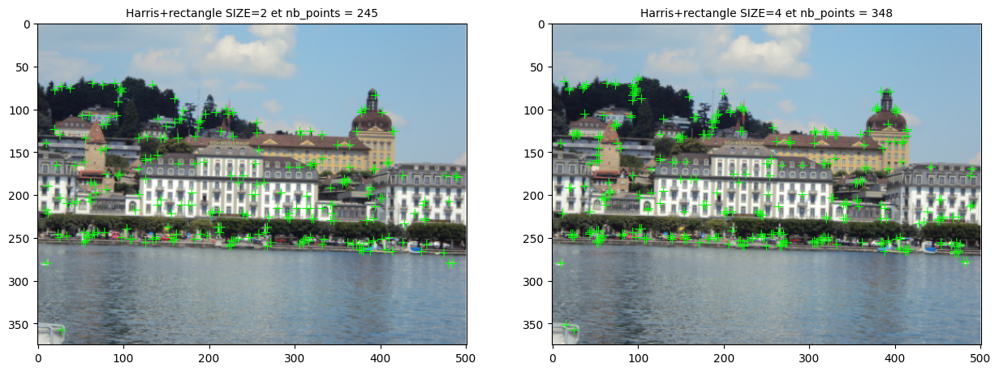

In [5]:
#influence et evolution de la taille de la fenetre

img_org = src_image.copy()
k = 0.04
coeff_seuil = 0.015

taille_fenetre = [2,4]

test_influence_taille_fenetre(img_org, Ix_carre, Iy_carre, Ixy, coeff_seuil, k,taille_fenetre, couleur)

#### <u> paramètre k </u>

Le paramètre k est un facteur qui contrôle la sensibilité du détecteur aux coins. Une valeur de k plus élevée rend le détecteur moins sensible et donc moins de coins sont détectés. Ci-dessous le resultat avec différentes valeurs de k : plus k est grand, moins il y a de points d'intérêt détectés.

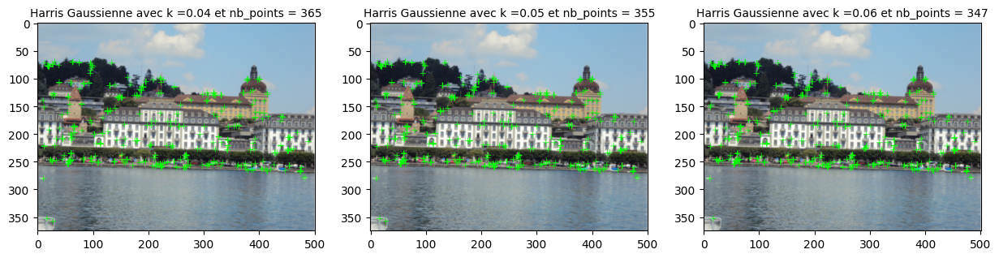

In [6]:
k_tab = [0.04, 0.05, 0.06]
img_org = src_image.copy()
#def test_influence_k(src_image, Ix_carre, Iy_carre, Ixy, seuil, k,couleur):
coeff_seuil = 0.015

test_influence_k(img_org, Ix_carre, Iy_carre, Ixy, coeff_seuil, k_tab,couleur)


### d) Rotation

- Fenetre rectangulaire : on voit que l'on a pas le meme nombre de points detectés. De plus , les points d'interets ne sont pas les mêmes. En effet, la fenetre rectangulaire ne prend pas en compte la rotation de l'image. On a donc des points d'interets qui ne sont pas les mêmes.

- Fenetre Gaussienne : on voit que l'on a le meme nombre de points detectés. De plus , les points d'interets sont les mêmes.


__Remarque__ : lorsque l'on tourne une image sur open CV, on a une perte de pixels. Cela peut expliquer les quelques différences entre les points d'intérêts détectés.

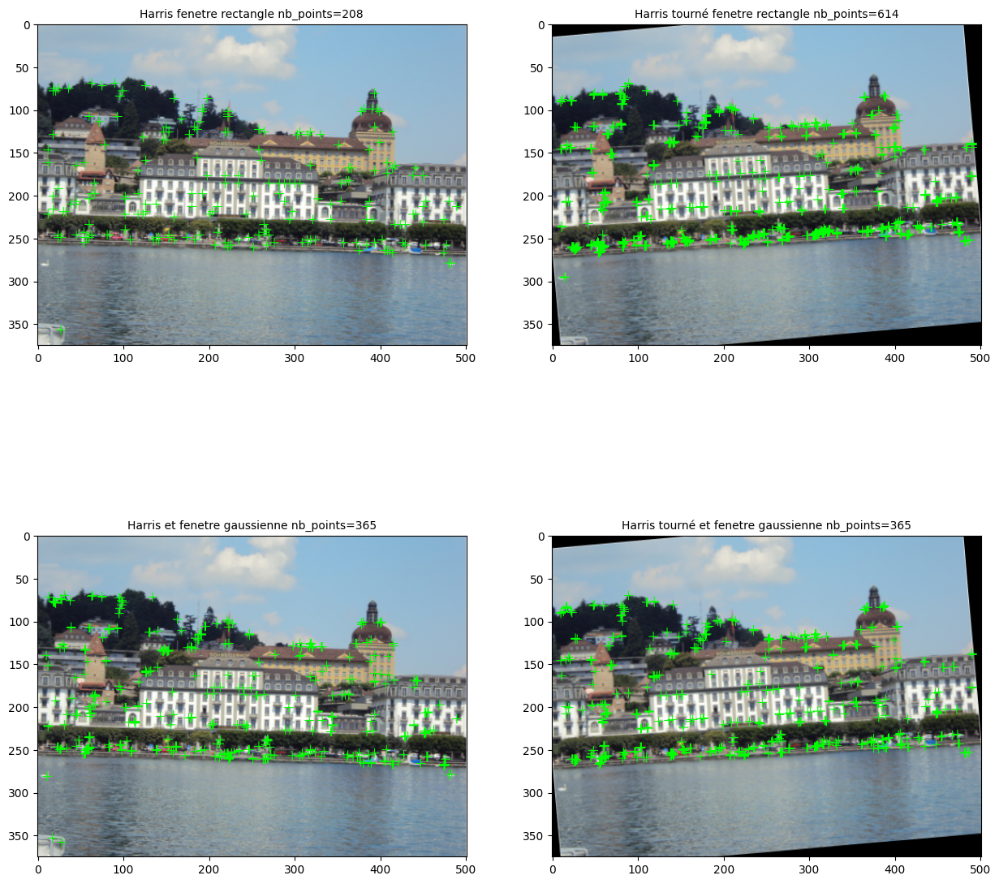

In [7]:
# Rotation de l'image 
#res, list_corners_no_supp_rect = Harris_rectangle(src_image, Ix_carre, Iy_carre, Ixy,seuil,k,False,taille_fenetre ,deplacement_fenetre,couleur)
# gaussienne : res_gauss,liste_coins_sans_supp = Harris_gaussienne(src_image, Ix_carre, Iy_carre, Ixy, masque_gaussien_formula,k, False, 0.015,couleur)

image_apres_rotation =rotate_image(src_image, 5)
image_apres_rotation_gris = gris_moyen(image_apres_rotation)


Ix_rot, Iy_rot, Ix_carre_rot, Iy_carre_rot, Ixy_rot = gradients(image_apres_rotation_gris)

k=0.04
flag_suppression = True # activer la suppression des non maxima
coeff_seuil = 0.015

res_rot_rect, l_rect = Harris_rectangle(image_apres_rotation, Ix_carre_rot, Iy_carre_rot, Ixy_rot,coeff_seuil,k,flag_suppression,3,1,couleur)
res_rot_rect = cv.cvtColor(res_rot_rect, cv.COLOR_BGR2RGB)

res_gauss_suppression_rot,_ = Harris_gaussienne(image_apres_rotation, Ix_carre_rot, Iy_carre_rot, Ixy_rot, masque_gaussien_formula,k,flag_suppression,coeff_seuil,couleur)
res_gauss_suppression_rot = cv.cvtColor(res_gauss_suppression_rot, cv.COLOR_BGR2RGB) 

res_gauss_suppression,liste_coins = Harris_gaussienne(src_image, Ix_carre, Iy_carre, Ixy, masque_gaussien_formula,k,True,0.015,couleur)
res_gauss_suppression = cv.cvtColor(res_gauss_suppression, cv.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.subplot(2,2,1)
plt.imshow(res_avec_suppression)
plt.title("Harris fenetre rectangle nb_points="+str(len(list_corners_with_supp_rect)), size=10)
plt.subplot(2,2,2)
plt.imshow(res_rot_rect)
plt.title("Harris tourné fenetre rectangle nb_points="+str(len(l_rect)), size=10)


plt.subplot(2,2,3)
plt.imshow(res_gauss_suppression)
plt.title("Harris et fenetre gaussienne nb_points="+str(len(liste_coins)), size=10)
plt.subplot(2,2,4)
plt.imshow(res_gauss_suppression_rot)
plt.title("Harris tourné et fenetre gaussienne nb_points="+str(len(liste_coins)), size=10)

plt.show()

## **2 Detecteur Fast**


1) Ci-dessous le résultat du detecteur FAST selon la méthode du cours. Les points d'interets affichés en rouge sont cohérents. La suppression des non-maxima locaux n'est pas encore implémentée et le sera a la question suivante pour comparaison.

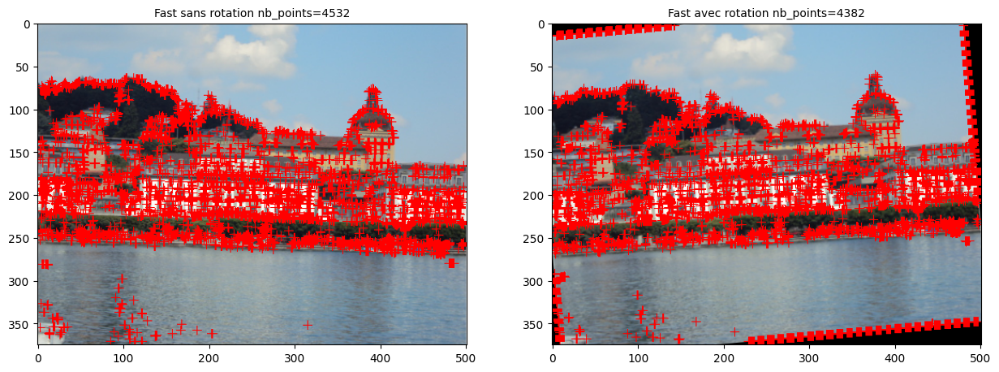

In [8]:


nb_voisins_successifs = 11
seuil_FAST = 20
image_apres_Fast,liste_FAST_corner = Fast_detector(src_image,nb_voisins_successifs,seuil_FAST)

# rotation de l'image
image_apres_rotation = rotate_image(src_image,5)
image_apres_Fast_rot,liste_FAST_corner_rot = Fast_detector(image_apres_rotation, nb_voisins_successifs,seuil_FAST)

image_apres_Fast = cv.cvtColor(image_apres_Fast, cv.COLOR_BGR2RGB)
image_apres_Fast_rot = cv.cvtColor(image_apres_Fast_rot, cv.COLOR_BGR2RGB)

#image_apres_Fast = cv.cvtColor(image_apres_Fast, cv.COLOR_BGR2RGB)

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(image_apres_Fast)
plt.title("Fast sans rotation nb_points="+str(len(liste_FAST_corner)), size=10)
plt.subplot(1,2,2)
plt.imshow(image_apres_Fast_rot)
plt.title("Fast avec rotation nb_points="+str(len(liste_FAST_corner_rot)), size=10)
plt.show()


On voit que si on regarde les points d'interets de l'image retournée, on observe les mêmes points d'interets. Ici, a cause de la rotation implémentée par openCV, l'image continent des bords non réel (pixels noirs). On observe donc des points d'interets sur ces bords, qui ne sont pas des points d'interets réels. Ainsi, si l'on ne tient pas en compte de cet effet de bord, on a des points d'interets qui sont les mêmes. __Le detecteur FAST est invariant a la rotation.__ Voyons l'implémentation de la suppression des non-maxima locaux.

1) Suppresssion des non-maxima locaux avec score :

Text(0.5, 1.0, 'Fast avec suppression des non maxima nb_points=1031')

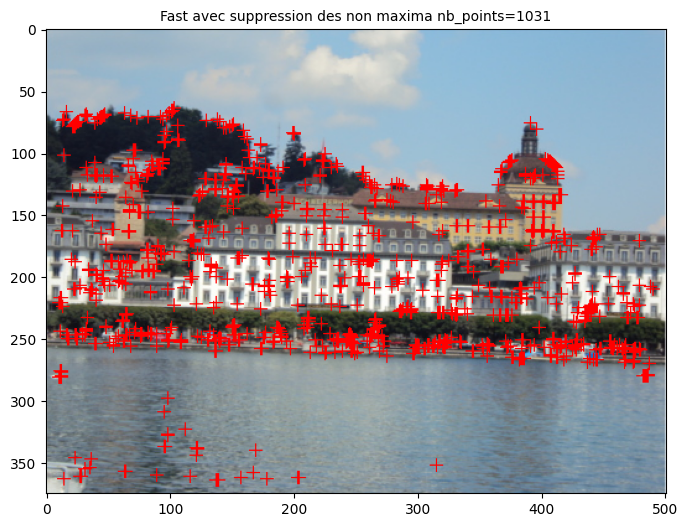

In [9]:
#test avec score : le score est constitué du nombre de pixels
#superieur au seuil dans une fenetre de 3x3

nb_voisins_successifs = 13


image_apres_Fast_avec_suppr, liste_FAST_corner_supp = Fast_detector_avec_score(src_image, nb_voisins_successifs,seuil_FAST)
image_apres_Fast_avec_suppr = cv.cvtColor(image_apres_Fast_avec_suppr, cv.COLOR_BGR2RGB)

plt.figure(figsize=(8,8))
plt.imshow(image_apres_Fast_avec_suppr)
plt.title("Fast avec suppression des non maxima nb_points="+str(len(liste_FAST_corner_supp)), size=10)


On constate que l'on a divisé d'un facteur 10 environ le nombre de points. Le score utilisé est, pour chaque point d'interét, le nombre de 1 successifs. Le point etant un point d'interet, le score variera entre le seuil et 16. On divise par 4 le nombre de points d'interets detectés.

## **3. Comparaison**


On constate que le detecteur FAST detecte un nombre bien plus conséquent de point d'intereet que le detecteur de Harris. 

De plus, le detecteur Fast (image Paysage) detecte plusieurs points dans des zones supposées homogène (dans l'eau par exemple). Cela est du au seuil choisi, que j'ai mis assez elevé. Le detecteur FAST semble plus sensible donc, et moins discriminant.

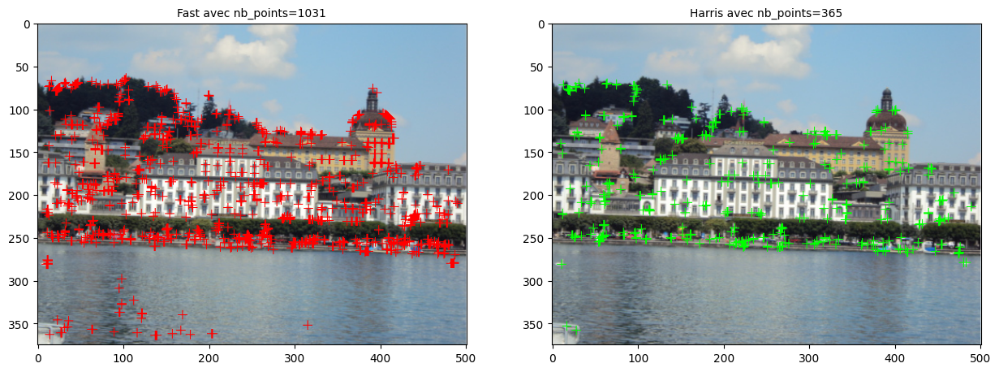

In [10]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.imshow(image_apres_Fast_avec_suppr)
plt.title("Fast avec nb_points="+str(len(liste_FAST_corner_supp)), size=10)
plt.subplot(1,2,2)
plt.imshow(res_gauss_suppression)
plt.title("Harris avec nb_points="+str(len(liste_coins)), size=10)
plt.show()

### b) Implémentation des fonctions d'openCV


- Detecteur de Harris : on constate que les 2 resultats sont très proches

Mon implémentation semble renvoyer moins de points trop proches : ils ont plus dispersés. Cela est du au seuil que j'ai choisi lors de l'étape de suppression des non-maxima locaux. 

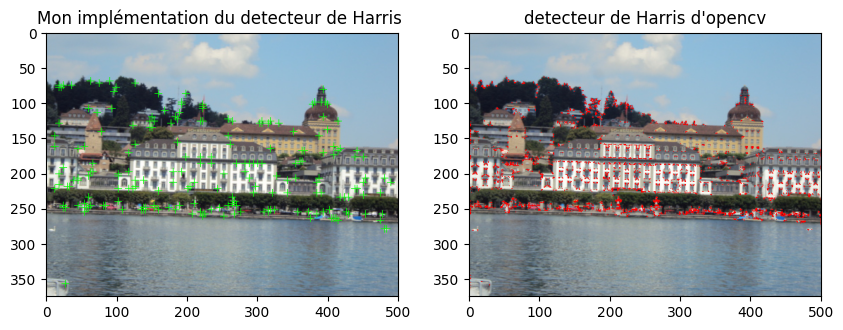

In [11]:

test_res_Harris_OPENCV(src_image.copy(), res_avec_suppression)


- Fast : on constate que les 2 resultats sont différents : le detecteur d'openCV est plus sensible aux coins, et detecte plus de points d'intérêt.
Tous comme soulevé précdemment , le detecteur FAST d'openCV semble très sensible aussi, et detecte un très grand nombre de points d'intérêt, et ce même dans des zones homogènes.


Au final, les résultats sont cohérent entre eux, les différences s'expliquent par les **différents seuils** que j'ai mis pour detecter les point d'intereêt.

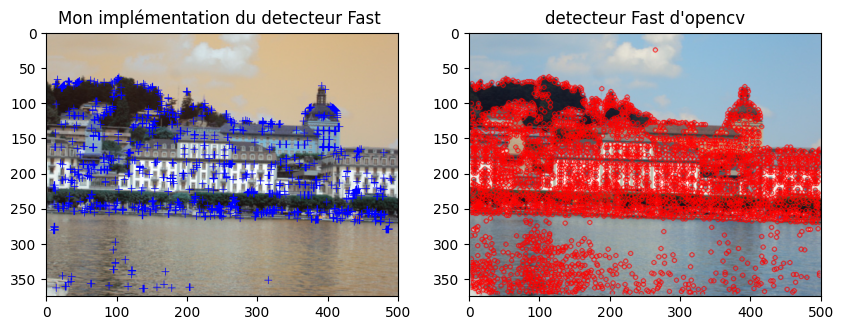

In [12]:
test_res_FAST_OPENCV(src_image.copy(), image_apres_Fast_avec_suppr)


## <u>EXERCICE 2: DESCRIPTION ET MATCHINGS DES POINTS D’INTERËT </u>


### a) Implementation de la récuperation d'un bloc d'intensité

Voir la fonction ```vecteur_autour_point_interet``` dans le code. De manière simple, on recupère le voisinnage d'un point d'interêt dont on connait les coordonnées et on le met dans un vecteur. On peut ensuite calculer la distance entre 2 vecteurs de points d'interêt.


### b) Implementation d'une méthode de matching, avec rejet des mauvais matchs via comparaison des distances


On commence tout d'abord par extraire les points d'interets de 2 images successives. J'utilise par  choix la méthode de Harris avec pondération gaussienne.


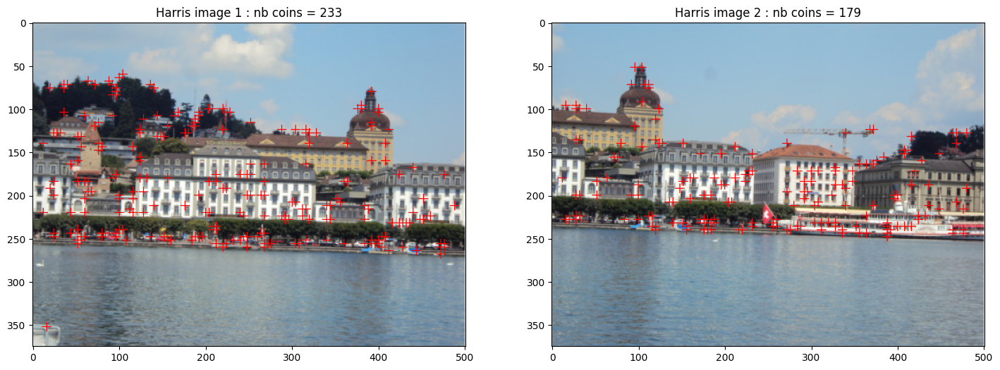

In [13]:

import numpy as np
import PIL
import cv2 as cv
from utils_tp import *
import matplotlib.pyplot as plt


image1_filename = "pics/P1.JPG"
image2_filename = "pics/P2.JPG"

src_1 = cv.imread(image1_filename)
src_2 = cv.imread(image2_filename)


src_1_gris =  gris_moyen(src_1)
src_2_gris =  gris_moyen(src_2)

Ix_1,Iy_1, Ix_carre_1, Iy_carre_1, Ixy_1 = gradients(src_1_gris)
Ix_2,Iy_2, Ix_carre_2, Iy_carre_2, Ixy_2 = gradients(src_2_gris)

k = 0.04
#+ on diminue coeff_seuil + on a de coins

coeff_seuil = 0.017
couleur = (0,0,255) #rouge
taille_fenetre = 5
deplacement_fenetre = 4

res1, liste_coins1 = Harris_rectangle(src_1, Ix_carre_1, Iy_carre_1, Ixy_1,coeff_seuil,k,True,taille_fenetre ,deplacement_fenetre,couleur)
res2, liste_coins2 = Harris_rectangle(src_2, Ix_carre_2, Iy_carre_2, Ixy_2,coeff_seuil,k,True,taille_fenetre ,deplacement_fenetre,couleur)


### MATPLOT AFFICHAGE
res1 = cv.cvtColor(res1, cv.COLOR_BGR2RGB)
res2 = cv.cvtColor(res2, cv.COLOR_BGR2RGB)


plt.figure(figsize=(20,15))
plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)
plt.subplot(1,2,1)
plt.imshow(res1)
plt.title("Harris image 1 : nb coins = "+str(len(liste_coins1)))
plt.subplot(1,2,2)
plt.imshow(res2)
plt.title("Harris image 2 : nb coins = "+str(len(liste_coins2)))
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
plt.show()

src_1_gris_normalise =  niveaux_de_gris_entre_0_et_1(src_1_gris)
src_2_gris_normalise =  niveaux_de_gris_entre_0_et_1(src_2_gris)


Par la suite, voir la fonction ```matching``` dans le code. Elle compare chaque descripteur de l'image 1 avec ceux de l'image 2 avec la distance voulue (l1 l2 ou correaltion normalisée croisée) . Les mauvais matchs sont rejetés via une comparaison des distances.


__Remarque__ : afin de gagner en temps de calcul,

- les images sont normalisées entre 0 et 1
- j'ai fixé ```coeff_seuil``` de sorte a ne pas avoir plus de 1500 points, sinon cela impacte le temps de calcul.
- la taille de la fenetre pour la description impacte aussi le temps de calcul. 


### Utilisation des métrique :
```operation_metrique``` est un paramètre fonction qui peut prendre différente valeur selon la **métrique utilisée**.

- ```l1_distance``` : distance euclidienne
- ```l2_distance``` : distance au carré
- ```correlation``` : correlation 
- ```correlation_normalisee``` : correlation normalisée croisée

## Implémentation 1: rejet des mauvais matchs ratio des distances

In [14]:
taille_fenetre_match = 55

liste_match , out1, out2= matching(src_1_gris, src_2_gris,
                       liste_coins1, liste_coins2, taille_fenetre_match,
                       l2_distance,0.92)

len liste_match =  13


#### Resultat visuel du matching et critiques

L'utilisateur peut regler la valeur de ```pas```  pour choisir de n'en afficher qu'un sur ```pas``` points, et mieux voir la qualité du matching.

<u> On constate que le matching est cohérent.  </u> Cependant, certains points ne correspondent pas dans la réalité. Cela est du au fait que certaines zones de l'image (les fenetres) se retrouvent plusieurs fois a des endroits différens, donc un descripteur A et B de l'image 1 peuvent etre  très similaire, et le detecteur 2, en fonction de l'ordre d'analyse des coins, pourra detecter un mauvais match en réalité, bien que très ressemblant.

Dans le cas des images ```P1.JPG``` et ```P2.JPG```, les arbres coté gauche sur la première image et les arbres coté droit sur la seconde image ne representent pas les mêmes arbres dans la réalité, mais se ressemblent beaucoup ( leur voisinnage), par conséquent, ils sont détectés comme des points d'intérêt similaires.

Dans le cas des images ```M1.JPG``` et ```M2.JPG```, certains points des sommets se ressemblent également beaucoup, créant de faux appariements.


Pour lutter contre cela, un moyen est de prendre une fenetre de taille importante, assurant ainsi une robustesse du descripteur. Ici j'ai choisi une fenetre de taille 50*50.

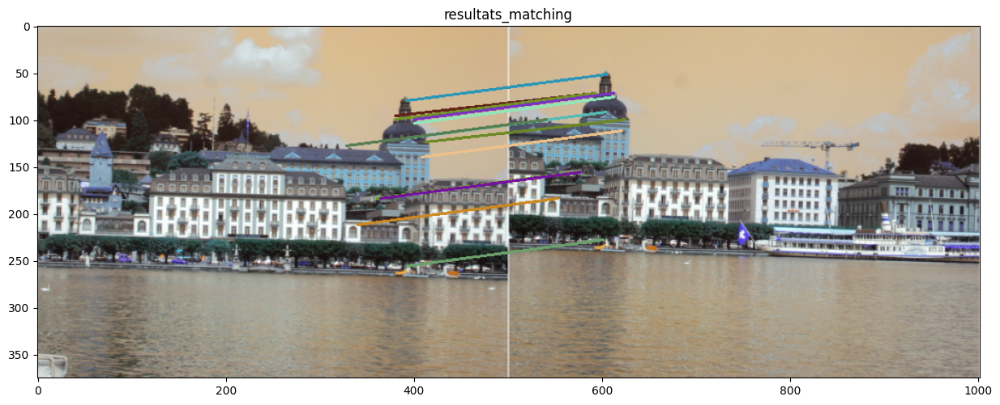

In [15]:

src_1 = cv.cvtColor(src_1, cv.COLOR_BGR2RGB)
src_2 = cv.cvtColor(src_2, cv.COLOR_BGR2RGB)
pas = 1
print_corners_with_concat_lines(src_1, src_2, liste_match, pas,"resultats_matching")


### c) Eudier l’influence de la taille du bloc et des metriques de comparaison utilisees sur la qualite de l’appariement

## **Influence des métriques de comparaison :**


Pour les metriques, on utilisera la correlation (et on etudiera l’interet de sa normalisation) ainsi qu’une autre metrique
au choix.

Le code ci dessous montre la comparaison entre :

- la distance L1
- la distance L2
- la correlation
- la correlation normalisée croisée

A taille de fenetre et ratio égaux, on voit que les 4 métriques donnent des résultats cohérents. La correlation normalisée croisée semble donné plus de match et est plus sensible. La distance L1 et L2 donnent des résultats similaires.

len liste_match =  22


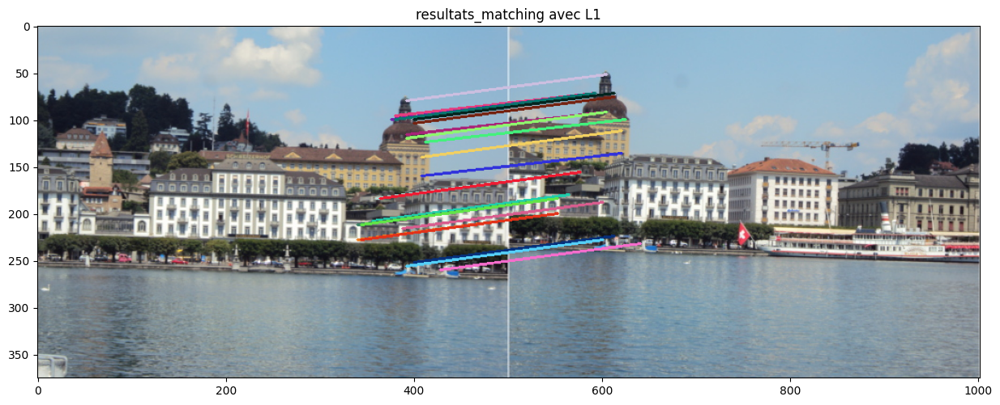

len liste_match =  20


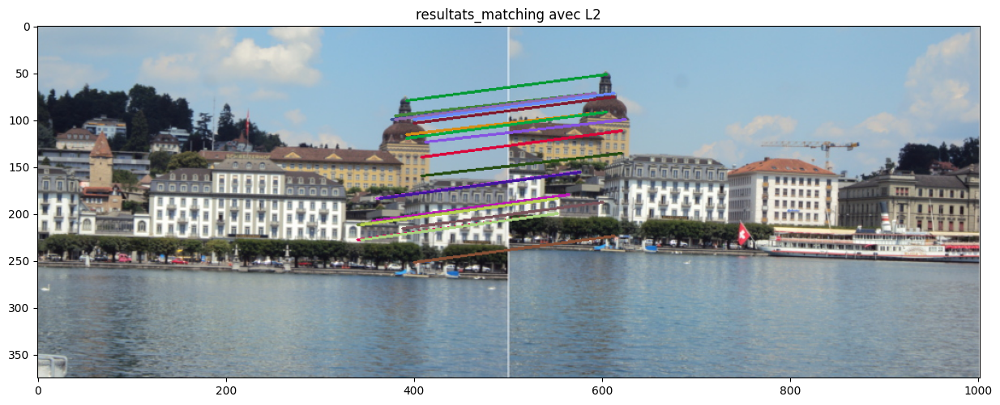

len liste_match =  33


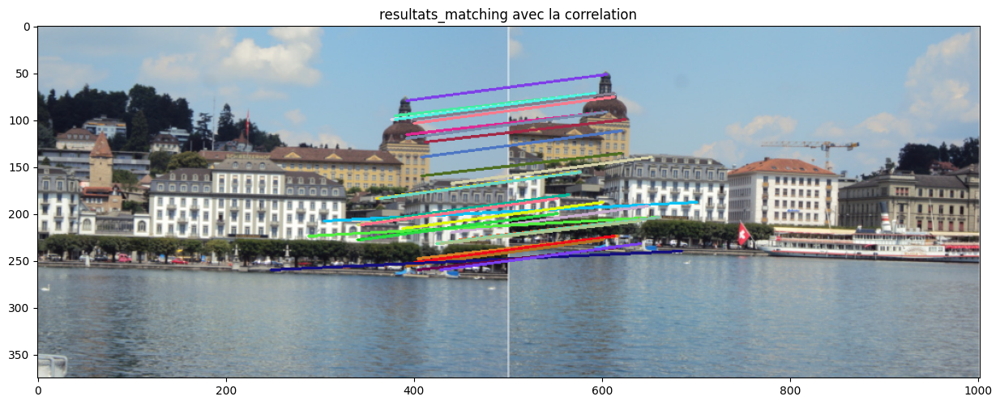

len liste_match =  33


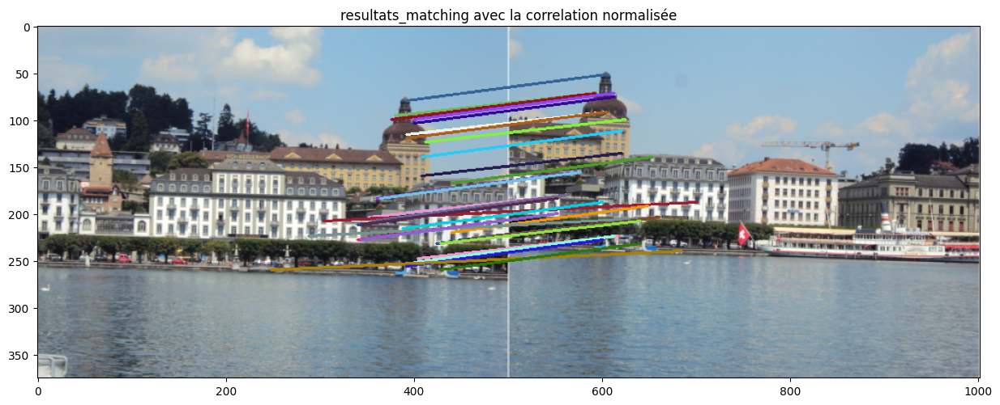

In [16]:
#on reste sur les coins de Harris des 2 images de la partie 2


taille_fenetre_match = 85

src_1 = cv.cvtColor(src_1, cv.COLOR_BGR2RGB)
src_2 = cv.cvtColor(src_2, cv.COLOR_BGR2RGB)


#### L1 
liste_match_l1,_,_ = matching(src_1_gris_normalise, src_2_gris_normalise, 
                       liste_coins1, liste_coins2, taille_fenetre_match,
                       l1_distance,0.68)

print_corners_with_concat_lines(src_1, src_2, liste_match_l1, pas,"resultats_matching avec L1")




#### L2

liste_match_l2,_,_  = matching(src_1_gris_normalise, src_2_gris_normalise, 
                       liste_coins1, liste_coins2, taille_fenetre_match,
                       l2_distance,0.68)

print_corners_with_concat_lines(src_1, src_2, liste_match_l2, pas,"resultats_matching avec L2")


#### correlation_croisee_normalisee
liste_match_correlation,_,_  = matching(src_1_gris_normalise, src_2_gris_normalise, 
                       liste_coins1, liste_coins2, taille_fenetre_match,
                       correlation_classique,0.68)
print_corners_with_concat_lines(src_1, src_2, liste_match_correlation, pas,"resultats_matching avec la correlation")


#### correlation_croisee_normalisee
liste_match_correlation_croisee,_,_  = matching(src_1_gris_normalise, src_2_gris_normalise, 
                       liste_coins1, liste_coins2, taille_fenetre_match,
                       correlation_croisee_normalisee,0.68)

print_corners_with_concat_lines(src_1, src_2, liste_match_correlation_croisee, pas,"resultats_matching avec la correlation normalisée")

## **Influence de la taille du bloc :**

La taille du bloc détermine la région voisinne du point d'intérêt qui sera utilisée pour calculer le descripteur. Plus le bloc est grand, plus la région capturée sera grande.

Une taille de bloc plus grande peut capturer davantage d'informations d'intensité autour du point d'intérêt, ce qui peut être utile pour la robustesse du descripteur.

Concrètement, les résultats sont affichés ci-dessous avec différentes tailles : la taille est affichée en titre du graphe. Plus la fenetre est grande , plus les descripteurs sont robustes, et le matching est meilleur. Cependant, le temps de calcul est plus important pour une fenetre plus grande.

__Une fenetre plus importante peremt de ne pas avoir de matching entre des points très ressemblants, mais qui ne sont pas les mêmes dans la réalité.__

len liste_match =  18
pour taille_fenetre_match =  40  on a  18  correspondances


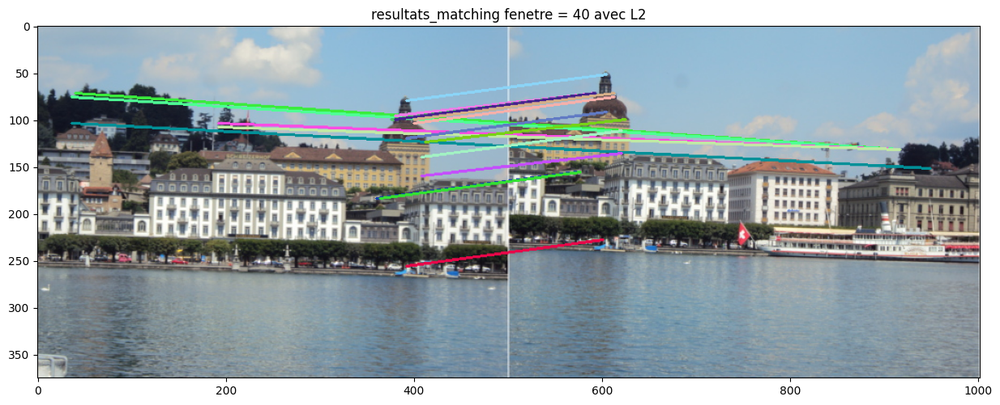

len liste_match =  15
pour taille_fenetre_match =  60  on a  15  correspondances


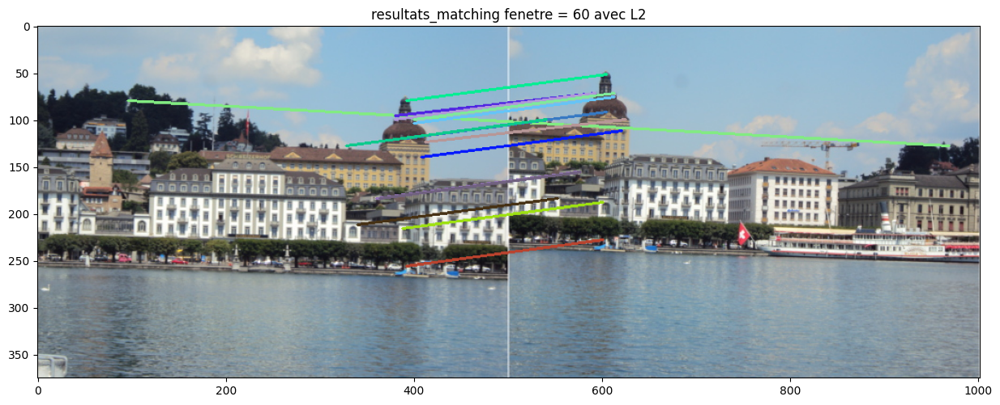

len liste_match =  15
pour taille_fenetre_match =  80  on a  15  correspondances


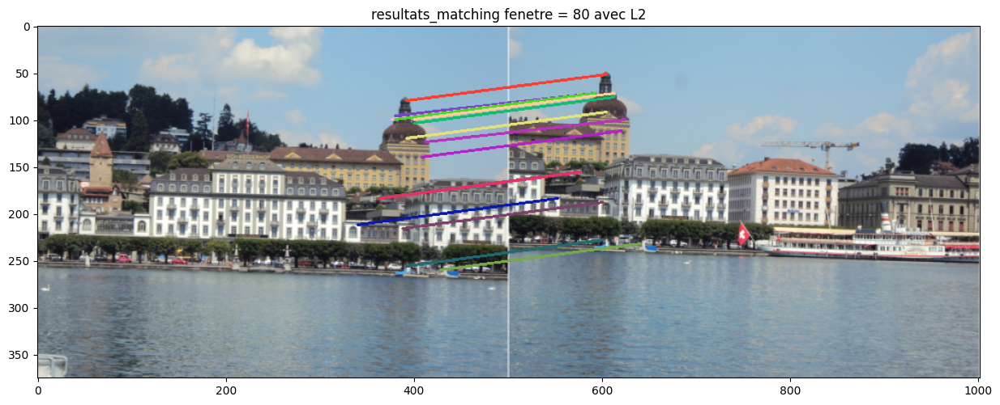

In [17]:
taille_fenetres_liste = [40,60,80]
pas = 1

    #sachant que liste_match = [[x1_M1,y1_M1,x1_M2,y1_M2], [x2_M1,y2_M1,x2_M2,y2_M2], ...]
    # #distance L2
for taille_fenetre_match in taille_fenetres_liste:
    liste_match_l2,_,_ = matching(src_1_gris, src_2_gris, 
                       liste_coins1, liste_coins2, taille_fenetre_match,
                       l2_distance,0.92)
    print("pour taille_fenetre_match = ",taille_fenetre_match," on a ",len(liste_match_l2)," correspondances")

    print_corners_with_concat_lines(src_1, src_2, liste_match_l2, pas,"resultats_matching fenetre = "+str(taille_fenetre_match)+" avec L2")


### d) Utiliser les fonctions existantes de Matlab ou Python pour effectuer une rotation de l’une des images. Les appariements obtenus sont-ils les memes que precedemmeent ? 

Ci-dessous, j'ai utilisé une seule et meme image. J'ai fais la detection et la description et le matching sur la version originale et la version tourné d'un angle ```àngle``` :  La detection est  faite avec un detecteur invariant en rotation. On s'attend donc avec le matching a  avoir les memes points d'interets. Cependant, on constate que ce n'est pas le cas. En effet, la rotation entraine une perte de pixels, et donc une perte d'information. Cela explique les quelques différences entre les points d'intérêts détectés. De plus, le descripteur utilisé n'est PAS invariant en rotation. **On a donc pas un matching invariant en rotation**

len liste_match =  3


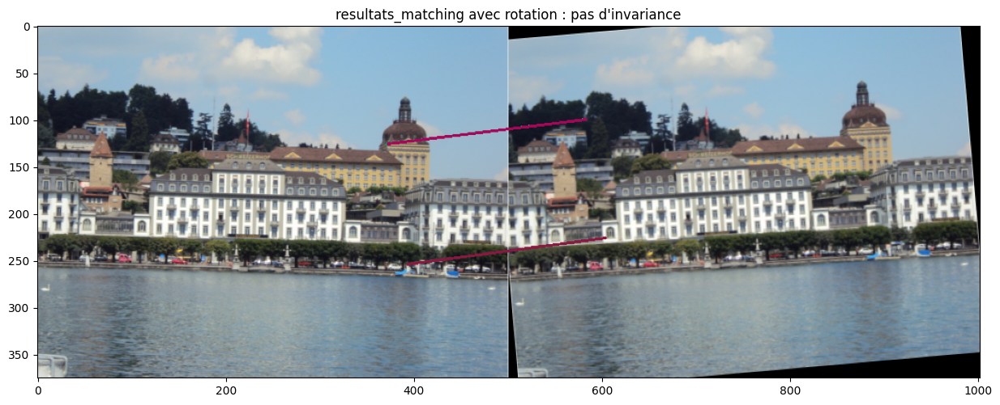

In [18]:
# Rotation de l'image 

src_image = cv.imread("pics/P1.JPG")
src_image2 =rotate_image(src_image, 5)


src_1_gris = gris_moyen(src_image)
src2_gris = gris_moyen(src_image2)


Ix_1,Iy_1, Ix_carre_1, Iy_carre_1, Ixy_1 = gradients(src_1_gris)
Ix_2,Iy_2, Ix_carre_2, Iy_carre_2, Ixy_2 = gradients(src2_gris)


k=0.04
flag_suppression = True # activer la suppression des non maxima
coeff_seuil = 0.015

res1,liste1 = Harris_gaussienne(src_image, Ix_carre_1, Iy_carre_1, Ixy_1, masque_gaussien_formula,k,flag_suppression,coeff_seuil,couleur)
res2,liste2 = Harris_gaussienne(src_image2, Ix_carre_2, Iy_carre_2, Ixy_2, masque_gaussien_formula,k,flag_suppression,coeff_seuil,couleur)

#def Harris_gaussienne(src, Ix_carre, Iy_carre, Ixy, masque_gaussien,k,flag_suppression_non_maxima,coeff_seuil,couleur):


src_1_gris_normalise =  niveaux_de_gris_entre_0_et_1(src_1_gris)
src_2_gris_normalise =  niveaux_de_gris_entre_0_et_1(src2_gris)


pas=1
taille_fenetre_match = 70
liste_match , out1, out2= matching(src_1_gris, src_2_gris,
                       liste1, liste2, taille_fenetre_match,
                       l2_distance,0.95)

print_corners_with_concat_lines(src_image, src_image2, liste_match, pas,"resultats_matching avec rotation : pas d'invariance")

Afin de remeedier a cela, il nous faut un descripteur invariant en rotation.

### LBP : Local Binary Pattern


Voir ``` vecteur_autour_point_interet_LBP``` qui implémente un descripteur invariant en rotation par transformation en code binaire minimal.

Cependant, ce descrpiteur est beaucoup moins efficace, car plusieurs points peuvent avoir le meme decripteur. On a donc un matching moins précis.



/home/spi-2019/Bureau/ROB5/TAimages/Detection/utils_tp.py:741: RuntimeWarning: invalid value encountered in scalar divide
  if distance_min_1/distance_min_2 < ratio :


distance_min_1 0
len liste_match =  1


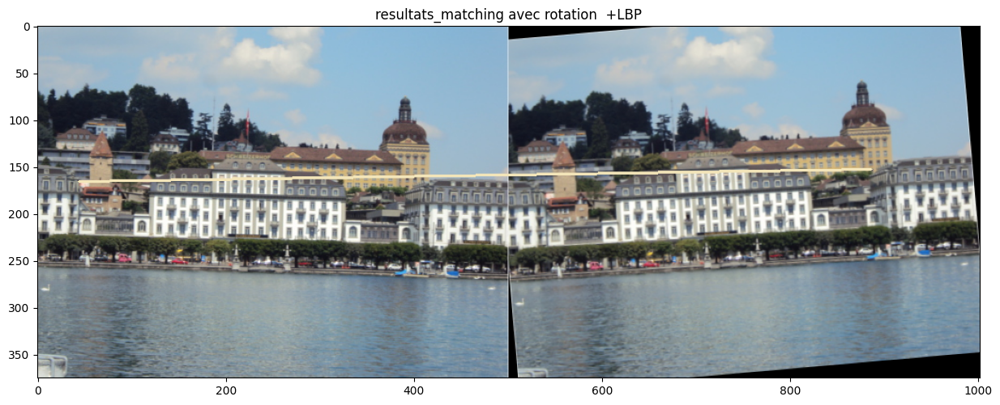

In [19]:
taille_fenetre_match = 10
# Rotation de l'image 

src_image = cv.imread("pics/P1.JPG")
src_image2 =rotate_image(src_image, 5)


src_1_gris = gris_moyen(src_image)
src2_gris = gris_moyen(src_image2)


Ix_1,Iy_1, Ix_carre_1, Iy_carre_1, Ixy_1 = gradients(src_1_gris)
Ix_2,Iy_2, Ix_carre_2, Iy_carre_2, Ixy_2 = gradients(src2_gris)


k=0.04
flag_suppression = True # activer la suppression des non maxima
coeff_seuil = 0.015

res1,liste1 = Harris_gaussienne(src_image, Ix_carre_1, Iy_carre_1, Ixy_1, masque_gaussien_formula,k,flag_suppression,coeff_seuil,couleur)
res2,liste2 = Harris_gaussienne(src_image2, Ix_carre_2, Iy_carre_2, Ixy_2, masque_gaussien_formula,k,flag_suppression,coeff_seuil,couleur)

#def Harris_gaussienne(src, Ix_carre, Iy_carre, Ixy, masque_gaussien,k,flag_suppression_non_maxima,coeff_seuil,couleur):


src_1_gris_normalise =  niveaux_de_gris_entre_0_et_1(src_1_gris)
src_2_gris_normalise =  niveaux_de_gris_entre_0_et_1(src2_gris)


pas=1
liste_match , out1, out2= matching_invariant(src_1_gris, src_2_gris,
                       liste1, liste2, taille_fenetre_match,l2_distance,0.08)



print_corners_with_concat_lines(src_image, src_image2, liste_match, pas,"resultats_matching avec rotation  +LBP")